[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/UltimateScrumMaster/Audio_Test/blob/main/Procesamiento_de_Audio_E.ipynb)

# Procesamiento de Señales en el dominio de la Frecuencia

## Ejemplo sencillo sobre una muestra de audio

In [210]:
# Archivos pueden arrastrarse al área de trabajo o procesarse en local

# Version Online
!wget https://github.com/UltimateScrumMaster/Audio_Test/blob/main/Test_1.wav

--2023-09-03 20:07:44--  https://github.com/UltimateScrumMaster/Audio_Test/blob/main/Test_1.wav
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4065 (4.0K) [text/plain]
Saving to: ‘Test_1.wav.2’

Test_1.wav.2        100%[===================>]   3.97K  --.-KB/s    in 0s      

2023-09-03 20:07:44 (50.8 MB/s) - ‘Test_1.wav.2’ saved [4065/4065]



In [211]:
import numpy as np
import scipy.io.wavfile as waves
from IPython.display import Audio
import matplotlib.pyplot as plt

# INGRESO
archivo = 'Test_1.wav'                   # Nombre del archivo
fs, grillo = waves.read(archivo)    # fs: frecuencia de muestreo del archivo.

In [212]:
print(fs)
print(grillo.shape)  # Tamaño del vector, cantidad de muestras temporales

44100
(1586176, 2)


In [213]:
grillo_1= grillo[:,0] # Selecciono uno de los canales

In [214]:
# Reproducir el Audio
Audio(grillo_1, rate=fs)

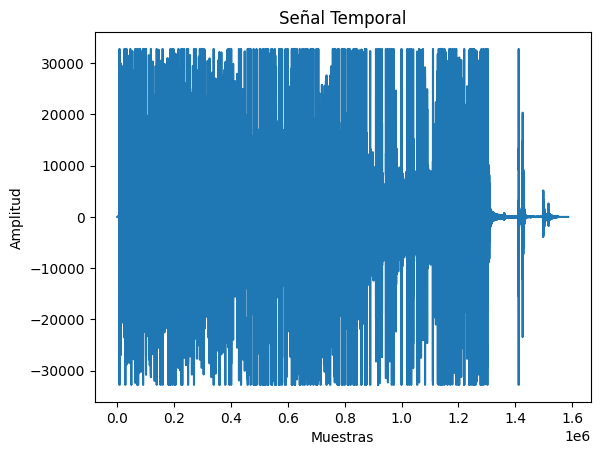

In [ ]:
# Ejemplo de visualización de la señal en el tiempo
plt.plot(grillo_1)
plt.xlabel("Muestras")
plt.ylabel("Amplitud")
plt.title("Señal Temporal")
plt.show()

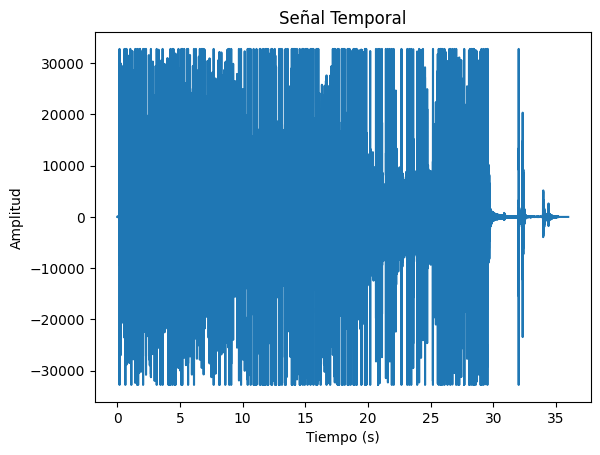

In [ ]:
# Ejemplo de visualización de la señal en el tiempo
t = np.arange(0, len(grillo_1)/fs, 1/fs)        # Vector de tiempo para el eje X. (Inicio, Fin, Paso) = (0 s, tiempo total del audio, distancia entre muestras)

plt.plot(t, grillo_1)
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.title("Señal Temporal")
plt.show()

In [ ]:
from scipy.fft import fft, fftfreq

Exception ignored in: <function Wave_write.__del__ at 0x7c104b9c7760>
Traceback (most recent call last):
  File "/usr/lib/python3.10/wave.py", line 326, in __del__
    self.close()
  File "/usr/lib/python3.10/wave.py", line 444, in close
    self._ensure_header_written(0)
  File "/usr/lib/python3.10/wave.py", line 467, in _ensure_header_written
    self._write_header(datasize)
  File "/usr/lib/python3.10/wave.py", line 471, in _write_header
    self._file.write(b'RIFF')
ValueError: I/O operation on closed file.


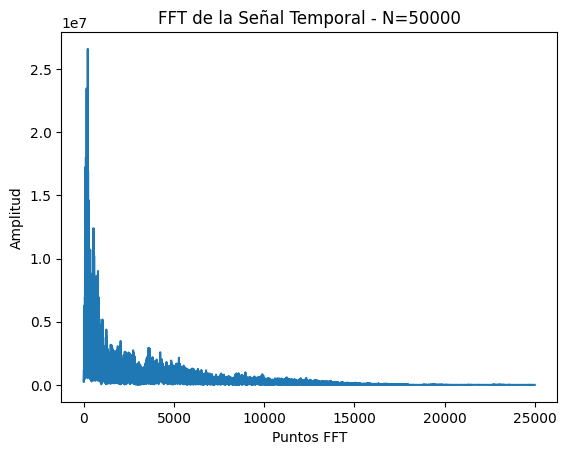

25000


In [ ]:
N = 50000       # Puntos para la FFT
OFFSET = 10     # Para filtrar muy bajas frecuencias

signal_fft = fft(grillo_1, n=N)     # Se calcula la FFT

plt.plot(abs(signal_fft[OFFSET:len(signal_fft)//2]))
plt.xlabel("Puntos FFT")
plt.ylabel("Amplitud")
plt.title("FFT de la Señal Temporal - N={}".format(N))
plt.show()


print(len(signal_fft)//2)

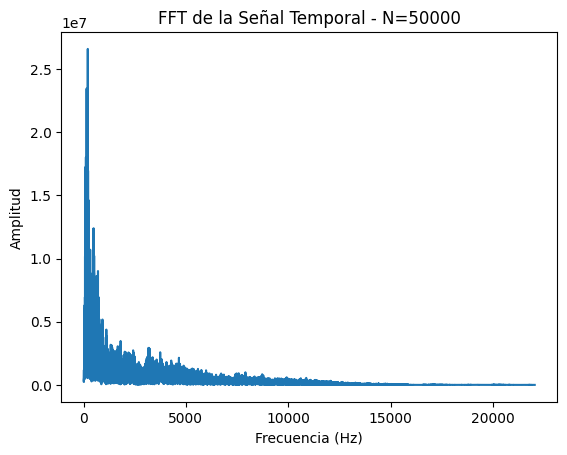

In [ ]:
xf = fftfreq(N, 1/fs)           # Vector de frecuencias, para los bins de la FFT de N puntos calculada

plt.plot(xf[OFFSET:len(xf)//2], abs(signal_fft[OFFSET:len(signal_fft)//2]))
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Amplitud")
plt.title("FFT de la Señal Temporal - N={}".format(N))
plt.show()

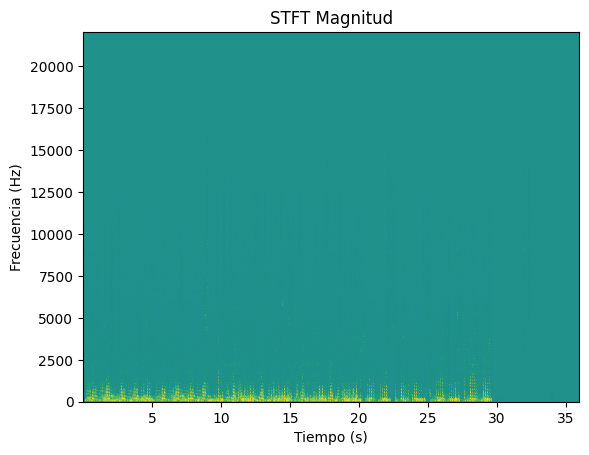

In [ ]:
from scipy.signal import spectrogram

f, t, Sxx = spectrogram(grillo_1, fs, nperseg=500)
plt.pcolormesh(t, f, Sxx, vmin=grillo_1.min(), vmax=grillo_1.max(), shading='gouraud')
plt.title('STFT Magnitud')
plt.ylabel('Frecuencia (Hz)')
plt.xlabel('Tiempo (s)')
plt.show()

In [ ]:
def specgram2d(y, srate=fs, title=None):
    # Espectrograma con distribución de potencias
    ax = plt.axes()
    ax.set_title(title, loc='center', wrap=True)
    spec, freqs, t, im = ax.specgram(y, Fs=srate, scale='dB', vmax=100, noverlap=200)
    ax.set_xlabel('Tiempo (s)')
    ax.set_ylabel('Frecuencia (Hz)')
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label('Amplitud (dB)')
    cbar.minorticks_on()

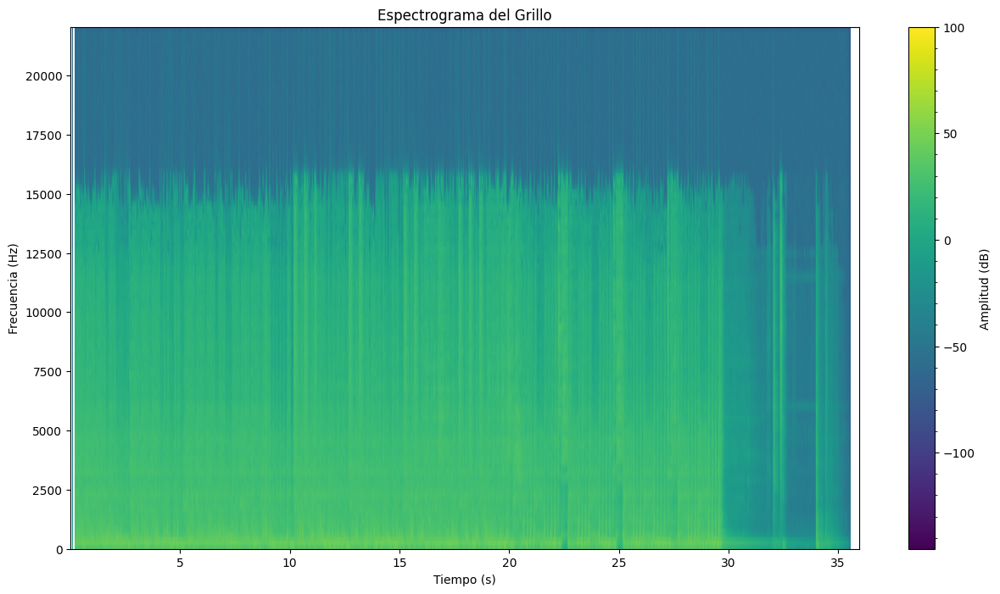

In [ ]:
plt.figure(figsize=(15, 8))
specgram2d(grillo_1, srate=fs, title="Espectrograma de la Muestra de Audio")
plt.show()

## Visualización sobre el Audio Completo

In [ ]:
archivo = 'Test_1.wav'
fs, todo_R = waves.read(archivo)

In [ ]:
todo= todo_R[:,0]

In [ ]:
# Reproducir el Audio
Audio(todo, rate=fs)

In [ ]:
len(todo)

1586176

In [ ]:
fs

44100

/usr/local/lib/python3.10/dist-packages/matplotlib/axes/_axes.py:7773: RuntimeWarning:

divide by zero encountered in log10



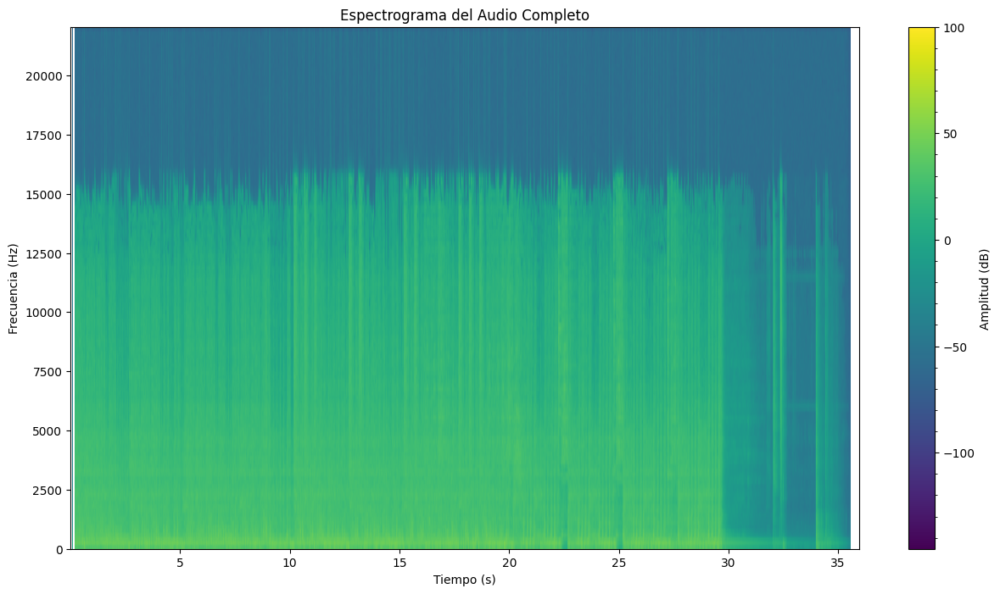

In [ ]:
plt.figure(figsize=(15, 8))
specgram2d(todo, srate=fs, title="Espectrograma del Audio Completo")
plt.show()

# Filtros

In [ ]:
import numpy as np
from scipy import signal

def filtro_pasa_bajos(datos, frecuencia_corte, frecuencia_muestreo, orden=10):
    """
    Aplica un filtro pasa bajos a una señal utilizando SciPy.

    Esta función aplica un filtro pasa bajos a una señal dada utilizando la biblioteca SciPy.

    Parámetros:
    ----------
    datos : array NumPy
        Un array NumPy que contiene la señal original.
    frecuencia_corte : float
        La frecuencia de corte del filtro en hertz (Hz).
    frecuencia_muestreo : float
        La frecuencia de muestreo de los datos en hertz (Hz).
    orden : int
        El orden del filtro.Calidad del filtro

    Retorna:
    -------
    array NumPy
        Un array NumPy que contiene la señal filtrada mediante el filtro pasa bajos.

    Ejemplos:
    --------
    # Crear una señal con datos de ejemplo
    frecuencia_muestreo = 1000  # Frecuencia de muestreo en Hz
    tiempo = np.arange(0, 1, 1 / frecuencia_muestreo)
    señal_original = np.sin(2 * np.pi * 50 * tiempo) + np.random.normal(0, 0.5, tiempo.shape)

    # Aplicar un filtro pasa bajos con frecuencia de corte de 100 Hz y orden 4 a la señal original
    frecuencia_corte = 100  # Frecuencia de corte en Hz
    orden = 4
    signal_filtrada = filtro_pasa_bajos(señal_original, frecuencia_corte, frecuencia_muestreo, orden)
    """
    nyquist_frecuencia = 0.5 * frecuencia_muestreo
    normal_frecuencia_corte = frecuencia_corte / nyquist_frecuencia
    b, a = signal.butter(orden, normal_frecuencia_corte, btype='low', analog=False)
    signal_filtrada = signal.lfilter(b, a, datos)
    return signal_filtrada


def filtro_pasa_altos(datos, frecuencia_corte, frecuencia_muestreo, orden=10):
    """
    Aplica un filtro pasa altos a una señal utilizando SciPy.

    Esta función aplica un filtro pasa altos a una señal dada utilizando la biblioteca SciPy.

    Parámetros:
    ----------
    datos : array NumPy
        Un array NumPy que contiene la señal original.
    frecuencia_corte : float
        La frecuencia de corte del filtro en hertz (Hz).
    frecuencia_muestreo : float
        La frecuencia de muestreo de los datos en hertz (Hz).
    orden : int
        El orden del filtro.Calidad del filtro

    Retorna:
    -------
    array NumPy
        Un array NumPy que contiene la señal filtrada mediante el filtro pasa altos.

    Ejemplos:
    --------
    # Crear una señal con datos de ejemplo
    frecuencia_muestreo = 1000  # Frecuencia de muestreo en Hz
    tiempo = np.arange(0, 1, 1 / frecuencia_muestreo)
    señal_original = np.sin(2 * np.pi * 50 * tiempo) + np.random.normal(0, 0.5, tiempo.shape)

    # Aplicar un filtro pasa altos con frecuencia de corte de 80 Hz y orden 4 a la señal original
    frecuencia_corte = 80  # Frecuencia de corte en Hz
    orden = 4
    signal_filtrada = filtro_pasa_altos(señal_original, frecuencia_corte, frecuencia_muestreo, orden)
    """
    nyquist_frecuencia = 0.5 * frecuencia_muestreo
    normal_frecuencia_corte = frecuencia_corte / nyquist_frecuencia
    b, a = signal.butter(orden, normal_frecuencia_corte, btype='high', analog=False)
    signal_filtrada = signal.lfilter(b, a, datos)
    return signal_filtrada


def filtro_pasa_banda(datos, frecuencia_corte_low, frecuencia_corte_high, frecuencia_muestreo, orden=10):
    """
    Aplica un filtro pasa banda a una señal utilizando SciPy.

    Esta función aplica un filtro pasa banda a una señal dada utilizando la biblioteca SciPy.

    Parámetros:
    ----------
    datos : array NumPy
        Un array NumPy que contiene la señal original.
    frecuencia_corte_low : float
        La frecuencia de corte baja del filtro en hertz (Hz).
    frecuencia_corte_high : float
        La frecuencia de corte alta del filtro en hertz (Hz).
    frecuencia_muestreo : float
        La frecuencia de muestreo de los datos en hertz (Hz).
    orden : int
        El orden del filtro.Calidad del filtro

    Retorna:
    -------
    array NumPy
        Un array NumPy que contiene la señal filtrada mediante el filtro pasa banda.

    Ejemplos:
    --------
    # Crear una señal con datos de ejemplo
    frecuencia_muestreo = 1000  # Frecuencia de muestreo en Hz
    tiempo = np.arange(0, 1, 1 / frecuencia_muestreo)
    señal_original = np.sin(2 * np.pi * 50 * tiempo) + np.random.normal(0, 0.5, tiempo.shape)

    # Aplicar un filtro pasa banda con frecuencias de corte baja y alta de 40 Hz y 60 Hz respectivamente, y orden 4 a la señal original
    frecuencia_corte_low = 40  # Frecuencia de corte baja en Hz
    frecuencia_corte_high = 60  # Frecuencia de corte alta en Hz
    orden = 4
    signal_filtrada = filtro_pasa_banda(señal_original, frecuencia_corte_low, frecuencia_corte_high, frecuencia_muestreo, orden)
    """
    nyquist_frecuencia = 0.5 * frecuencia_muestreo
    normal_frecuencia_corte_low = frecuencia_corte_low / nyquist_frecuencia
    normal_frecuencia_corte_high = frecuencia_corte_high / nyquist_frecuencia
    b, a = signal.butter(orden, [normal_frecuencia_corte_low, normal_frecuencia_corte_high], btype='band', analog=False)
    signal_filtrada = signal.lfilter(b, a, datos)
    return signal_filtrada


def filtro_elimina_banda(datos, frecuencia_corte_low, frecuencia_corte_high, frecuencia_muestreo, orden=10):
    """
    Aplica un filtro elimina banda a una señal utilizando SciPy.

    Esta función aplica un filtro elimina banda a una señal dada utilizando la biblioteca SciPy.

    Parámetros:
    ----------
    datos : array NumPy
        Un array NumPy que contiene la señal original.
    frecuencia_corte_low : float
        La frecuencia de corte baja del filtro en hertz (Hz).
    frecuencia_corte_high : float
        La frecuencia de corte alta del filtro en hertz (Hz).
    frecuencia_muestreo : float
        La frecuencia de muestreo de los datos en hertz (Hz).
    orden : int
        El orden del filtro.Calidad del filtro

    Retorna:
    -------
    array NumPy
        Un array NumPy que contiene la señal filtrada mediante el filtro elimina banda.

    Ejemplos:
    --------
    # Crear una señal con datos de ejemplo
    frecuencia_muestreo = 1000  # Frecuencia de muestreo en Hz
    tiempo = np.arange(0, 1, 1 / frecuencia_muestreo)
    señal_original = np.sin(2 * np.pi * 50 * tiempo) + np.random.normal(0, 0.5, tiempo.shape)

    # Aplicar un filtro elimina banda con frecuencias de corte baja y alta de 45 Hz y 55 Hz respectivamente, y orden 4 a la señal original
    frecuencia_corte_low = 45  # Frecuencia de corte baja en Hz
    frecuencia_corte_high = 55  # Frecuencia de corte alta en Hz
    orden = 4
    signal_filtrada = filtro_elimina_banda(señal_original, frecuencia_corte_low, frecuencia_corte_high, frecuencia_muestreo, orden)
    """
    nyquist_frecuencia = 0.5 * frecuencia_muestreo
    normal_frecuencia_corte_low = frecuencia_corte_low / nyquist_frecuencia
    normal_frecuencia_corte_high = frecuencia_corte_high / nyquist_frecuencia
    b, a = signal.butter(orden, [normal_frecuencia_corte_low, normal_frecuencia_corte_high], btype='bandstop', analog=False)
    signal_filtrada = signal.lfilter(b, a, datos)
    return signal_filtrada


def filtro_notch(datos, frecuencia_central, frecuencia_muestreo, quality=30):
    """
    Aplica un filtro notch (rechazo de banda) a una señal utilizando SciPy.

    Este filtro es útil para eliminar componentes en una frecuencia específica y
    su alrededor, útil por ejemplo para eliminar ruido proveniente de una interferencia (50 Hz de la red, por ejemplo).

    Esta función aplica un filtro notch a una señal dada utilizando la biblioteca SciPy.

    Parámetros:
    ----------
    datos : array NumPy
        Un array NumPy que contiene la señal original.
    frecuencia_central : float
        La frecuencia central del filtro notch en hertz (Hz).
    frecuencia_muestreo : float
        La frecuencia de muestreo de los datos en hertz (Hz).
    quality : int
        Factor de calidad del filtro.

    Retorna:
    -------
    array NumPy
        Un array NumPy que contiene la señal filtrada mediante el filtro notch.

    Ejemplos:
    --------
    # Crear una señal con datos de ejemplo
    frecuencia_muestreo = 1000  # Frecuencia de muestreo en Hz
    tiempo = np.arange(0, 1, 1 / frecuencia_muestreo)
    señal_original = np.sin(2 * np.pi * 50 * tiempo) + np.random.normal(0, 0.5, tiempo.shape)

    # Aplicar un filtro notch con frecuencia central de 50 Hz, y factor de calidad 4 a la señal original
    frecuencia_central = 50  # Frecuencia central en Hz
    quality = 4
    signal_filtrada = filtro_notch(señal_original, frecuencia_central, frecuencia_muestreo, quality)
    """
    b, a = signal.iirnotch(frecuencia_central, quality, frecuencia_muestreo)
    signal_filtrada = signal.filtfilt(b, a, datos)
    return signal_filtrada

# Pruebas de Filtrado

Borramos los grillos que están en todo el audio, poco arriba de los 4000 Hz.

In [ ]:
todo_fil_elim_banda = filtro_elimina_banda(todo, frecuencia_corte_low=60, frecuencia_corte_high=500, frecuencia_muestreo=fs, orden=4)

Exception ignored in: <function Wave_write.__del__ at 0x7c104b9c7760>
Traceback (most recent call last):
  File "/usr/lib/python3.10/wave.py", line 326, in __del__
    self.close()
  File "/usr/lib/python3.10/wave.py", line 444, in close
    self._ensure_header_written(0)
  File "/usr/lib/python3.10/wave.py", line 467, in _ensure_header_written
    self._write_header(datasize)
  File "/usr/lib/python3.10/wave.py", line 471, in _write_header
    self._file.write(b'RIFF')
ValueError: I/O operation on closed file.


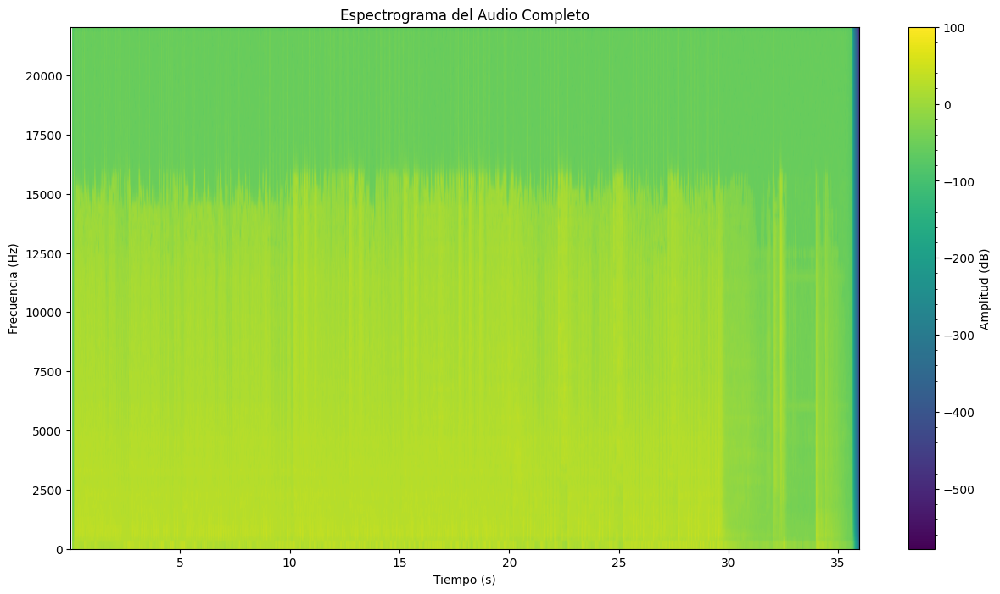

In [ ]:
plt.figure(figsize=(15, 8))
specgram2d(todo_fil_elim_banda, srate=fs, title="Espectrograma del Audio Completo")
plt.show()

In [ ]:
# Reproducir el Audio Filtrado
Audio(todo_fil_elim_banda, rate=fs)

In [ ]:
todo_fil_chicharra = filtro_notch(todo_fil_elim_banda, frecuencia_central=220, frecuencia_muestreo=fs, quality=4) # Calidad más alta, quita puntualmente esa frecuencia.

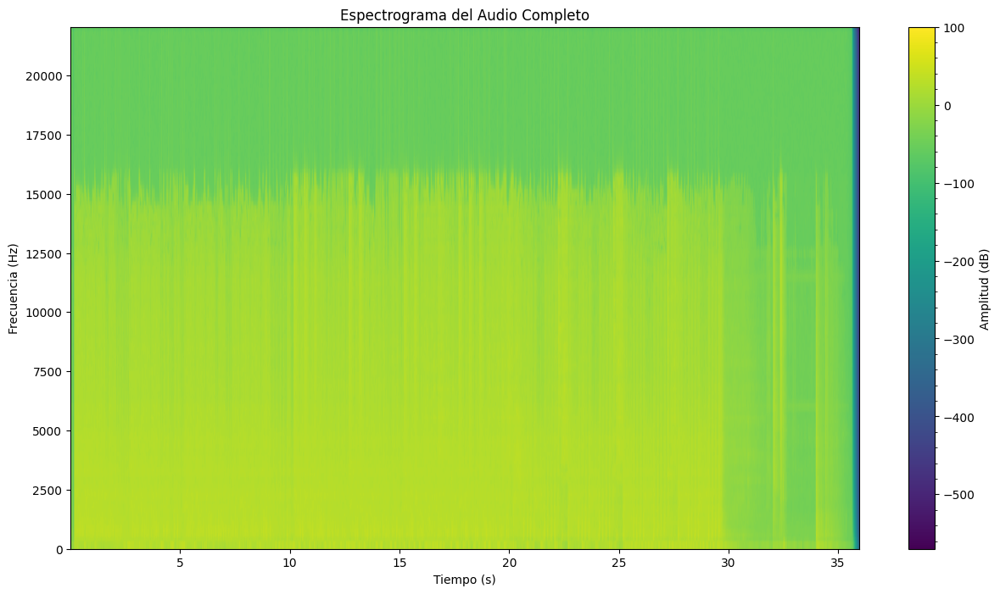

In [ ]:
plt.figure(figsize=(15, 8))
specgram2d(todo_fil_chicharra, srate=fs, title="Espectrograma del Audio Completo")
plt.show()

In [ ]:
# Reproducir el Audio Filtrado
Audio(todo_fil_chicharra, rate=fs)